<a href="https://colab.research.google.com/github/PraeJi/Brain-Tumor-Detection/blob/main/augmentation_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Load Dataset

In [ ]:
!kaggle datasets download -d pkdarabi/medical-image-dataset-brain-tumor-detection

Dataset URL: https://www.kaggle.com/datasets/pkdarabi/medical-image-dataset-brain-tumor-detection
License(s): Attribution 4.0 International (CC BY 4.0)
 97% 110M/113M [00:01<00:00, 106MB/s]  
100% 113M/113M [00:01<00:00, 81.1MB/s]


In [ ]:
import zipfile

with zipfile.ZipFile('/content/medical-image-dataset-brain-tumor-detection.zip', 'r') as zip_ref:
    zip_ref.extractall('/content')

In [ ]:
from PIL import Image,ImageDraw,ImageFont
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random
import os
from tqdm import tqdm
from shutil import copyfile
import pandas as pd
import numpy as np
import cv2
import albumentations as A


import torch
from torch.utils.data import Dataset
import yaml


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.15 (you have 1.4.14). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


# Create Dataframe

In [ ]:
import os
from os import listdir

folder_train_img = "/content/BrainTumorDetectionYolov9/BrainTumorDetectionYolov9/train/images/"
folder_train_label = "/content/BrainTumorDetectionYolov9/BrainTumorDetectionYolov9/train/labels/"

In [ ]:
dataframe_gb = []

In [ ]:
# Calculate xmin,ymin,xmax,ymax

def calculate_train(filename,x_center,y_center,width,height):
  path_img = f"{folder_train_img}/{filename}"
  im = Image.open(path_img).convert("RGB")
  img_width, img_height = im.size

  x_center_pixel = x_center * img_width
  y_center_pixel = y_center * img_height
  half_width_pixel = width * img_width / 2
  half_height_pixel = height * img_height / 2

  x_min = x_center_pixel - half_width_pixel
  y_min = y_center_pixel - half_height_pixel
  x_max = x_center_pixel + half_width_pixel
  y_max = y_center_pixel + half_height_pixel

  return x_min,y_min,x_max,y_max

In [ ]:
for labels_file in os.listdir(folder_train_label):
  file_path = f"{folder_train_label}/{labels_file}"
  file = open(file_path,"r")
  content = file.readlines()
  filename = labels_file[:-4] + '.jpg'

  for line in content:
    parts = line.strip().split()
    label = int(parts[0])
    x_center = float(parts[1])
    y_center = float(parts[2])
    width = float(parts[3])
    height = float(parts[4])

    x_min,y_min,x_max,y_max = calculate_train(filename,x_center,y_center,width,height)

    dataframe_gb.append({
      'Filename': filename,
      'Label': int(label),
      'x_Center': x_center,
      'y_Center': y_center,
      'width': width,
      'height': height,
      'x_min': x_min,
      'y_min': y_min,
      'x_max': x_max,
      'y_max': y_max,
      'path' : f"{folder_train_img}/"
    })

  file.close

In [ ]:
dataframe_gb = pd.DataFrame(dataframe_gb)
dataframe_gb.head()

,Filename,Label,x_Center,y_Center,width,height,x_min,y_min,x_max,y_max,path
0,volume_222_slice_74_jpg.rf.3941e9dea787e33f894...,1,0.676259,0.299242,0.028777,0.007576,92.0,39.0,96.0,40.0,/content/BrainTumorDetectionYolov9/BrainTumorD...
1,volume_66_slice_97_jpg.rf.5586fc61c91707dd98fa...,0,0.374101,0.193182,0.071942,0.113636,47.0,18.0,57.0,33.0,/content/BrainTumorDetectionYolov9/BrainTumorD...
2,volume_66_slice_97_jpg.rf.5586fc61c91707dd98fa...,1,0.485612,0.231061,0.410072,0.416667,39.0,3.0,96.0,58.0,/content/BrainTumorDetectionYolov9/BrainTumorD...
3,volume_66_slice_97_jpg.rf.5586fc61c91707dd98fa...,2,0.356115,0.155303,0.136691,0.219697,40.0,6.0,59.0,35.0,/content/BrainTumorDetectionYolov9/BrainTumorD...
4,volume_168_slice_64_jpg.rf.bf12545075688531ff5...,0,0.776978,0.250000,0.201439,0.121212,94.0,25.0,122.0,41.0,/content/BrainTumorDetectionYolov9/BrainTumorD...


In [ ]:
dataframe_gb.shape

(15041, 11)

# Test Augmentation Image

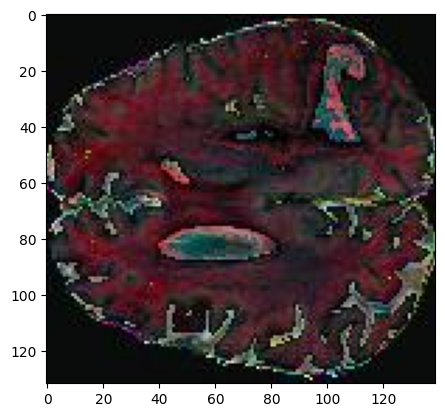

In [ ]:
img = Image.open('/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/images/volume_100_slice_100_jpg.rf.ac33e0ac3a1eebeb5e262e8a6f7de5d9.jpg')
plt.imshow(img)

In [ ]:
import torchvision.transforms as transforms

In [ ]:
import cv2
import os
import albumentations as A

# Define augmentation pipeline
transform = A.Compose([
    A.HorizontalFlip(p=0.7),
    A.RandomBrightnessContrast(p=0.7),
    A.Rotate(limit=40, p=0.7),
    A.RandomCrop(width=128, height=128, p=1.0),
])

# Function to load an image, apply augmentation, and save it
def augment_and_save(img_name,image_path, save_dir, augmentations, num_augmentations=1):
    # Load the image
    image = cv2.imread(image_path)

    # Create save directory if it doesn't exist
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    # Perform augmentations multiple times
    for i in range(num_augmentations):
        augmented = augmentations(image=image)
        augmented_image = augmented["image"]

        # Save the augmented image
        save_path = os.path.join(save_dir, f"{img_name[:-4]}_augmented.jpg")
        cv2.imwrite(save_path, augmented_image)
        print(f"Saved: {save_path}")


for img_name in os.listdir('/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/images/'):
  image_path = f'/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/images/{img_name}'
  save_dir = '/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/'
  augment_and_save(img_name, image_path, save_dir, transform, num_augmentations=1)

# Usage
#image_path = "/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/images/volume_100_slice_100_jpg.rf.ac33e0ac3a1eebeb5e262e8a6f7de5d9.jpg"  # Replace with your image path
#save_dir = "/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/"   # Directory to save augmented images
#augment_and_save(image_path, save_dir, transform, num_augmentations=10)


Streaming output truncated to the last 5000 lines.
Saved: /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/volume_145_slice_57_jpg.rf.6e32a5f33526e96b5a81a0a5f3defc68_augmented.jpg
Saved: /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/volume_227_slice_51_jpg.rf.16f2826fe2efbb3e9c0870f538cc19b4_augmented.jpg
Saved: /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/volume_7_slice_45_jpg.rf.4dd845ad4928c5c14a95f2702c222b37_augmented.jpg
Saved: /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/volume_212_slice_82_jpg.rf.8d0f8c964624d093fb44f621aa4aebaa_augmented.jpg
Saved: /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/volume_255_slice_61_jpg.rf.e8b6fca9bc9a90bb70835207cefa2fec_augmented.jpg
Saved: /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/volume_26_slice_86_jpg.rf.622939847a4c168441f518fd5850daad_augmented.jp

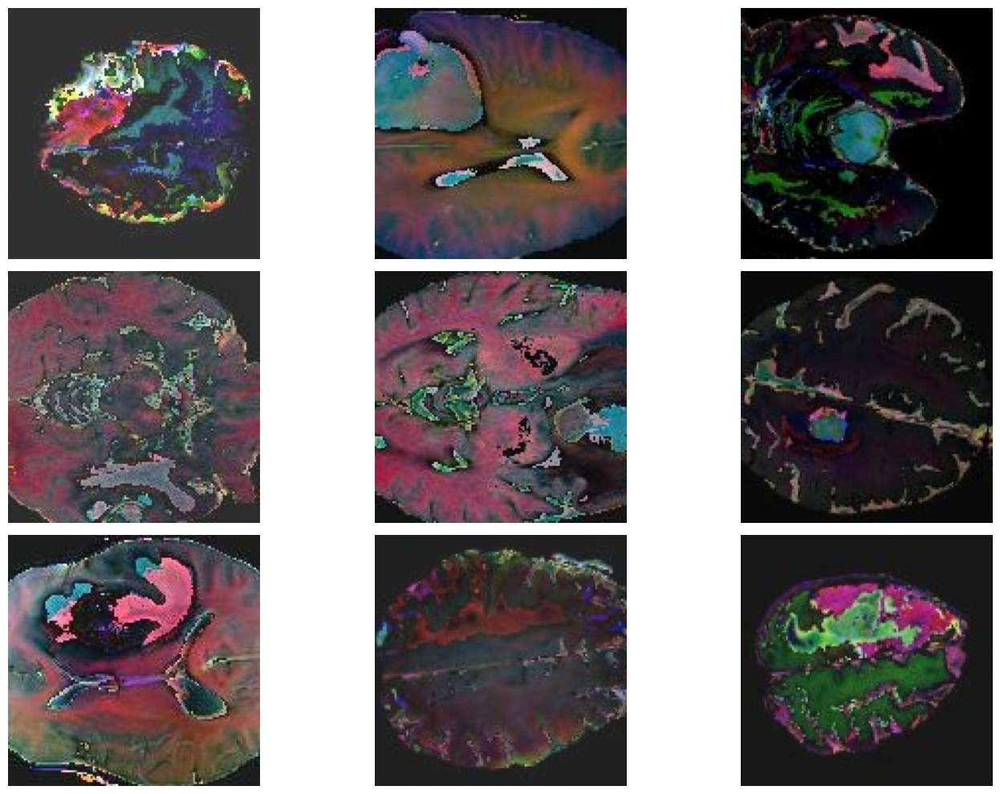

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

path = '/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/'
images_shown = 0

plt.figure(figsize=(15, 10))  # Adjust figure size as needed

for i in os.listdir(path):
    item_path = path + i
    if os.path.isfile(item_path) and item_path.lower().endswith('.jpg'):  # Check if it's an image file
        img = Image.open(item_path)

        plt.subplot(3, 3, images_shown + 1)  # 3 rows, 3 columns of images
        plt.imshow(img)
        plt.axis('off')  # Turn off axis labels

        images_shown += 1
        if images_shown >= 9:
            break

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

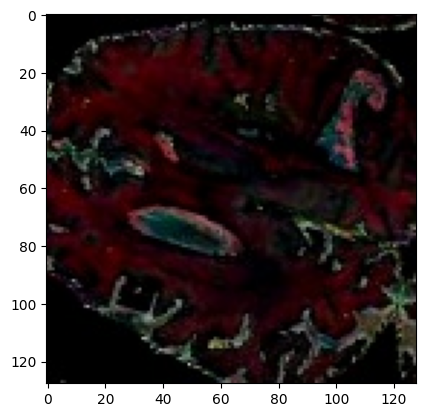

In [ ]:
img = Image.open('/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/volume_100_slice_100_jpg.rf.ac33e0ac3a1eebeb5e262e8a6f7de5d9_augmented.jpg')
plt.imshow(img)

# Test Augmentation Image and Label

In [ ]:
import cv2
import os
import albumentations as A
import pandas as pd

# Define augmentation pipeline
transform = A.Compose([
    A.HorizontalFlip(p=0.7),
    A.RandomBrightnessContrast(p=0.7),
    A.Rotate(limit=40, p=0.7),
    A.RandomCrop(width=128, height=128, p=1.0),
], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'], min_visibility=0.2))

# Function to convert bounding boxes from Pascal VOC format to YOLO format
def convert_to_yolo(bbox, img_width, img_height):
    x_min, y_min, x_max, y_max = bbox
    center_x = (x_min + x_max) / 2 / img_width
    center_y = (y_min + y_max) / 2 / img_height
    width = (x_max - x_min) / img_width
    height = (y_max - y_min) / img_height
    return [center_x, center_y, width, height]

# Function to load an image, apply augmentation, and save the augmented image and bounding boxes
def augment_and_save(img_name, image_path, save_dir, bboxes, class_labels, augmentations, num_augmentations=1):
    # Load the image
    image = cv2.imread(image_path)

    # Check if the image is loaded properly
    if image is None:
        raise FileNotFoundError(f"Image at path {image_path} could not be loaded. Please check if the file exists and the path is correct.")

    img_height, img_width = image.shape[:2]

    # Convert bounding boxes to YOLO format
    yolo_bboxes = [convert_to_yolo(bbox, img_width, img_height) for bbox in bboxes]

    # Create save directory if it doesn't exist
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    # Perform augmentations multiple times
    for i in range(num_augmentations):
        augmented = augmentations(image=image, bboxes=yolo_bboxes, class_labels=class_labels)
        augmented_image = augmented["image"]
        augmented_bboxes = augmented["bboxes"]

        # Save the augmented image
        save_image_path = os.path.join(save_dir, f"{img_name[:-4]}_augmented_{i}.jpg")
        cv2.imwrite(save_image_path, augmented_image)

        # Save the augmented bounding boxes in YOLO format
        save_label_path = os.path.join(save_dir, f"{img_name[:-4]}_augmented_{i}.txt")
        with open(save_label_path, 'w') as f:
            for bbox, label in zip(augmented_bboxes, class_labels):
                center_x, center_y, width, height = bbox
                f.write(f"{label} {center_x} {center_y} {width} {height}\n")

        print(f"Saved: {save_image_path} and {save_label_path}")


# Example to loop through images and corresponding bounding boxes
# Assuming `dataframe_gb` contains the bounding box data in Pascal VOC format (x_min, y_min, x_max, y_max)
for img_name in os.listdir('/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/images/'):
    image_path = f'/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/images/{img_name}'
    save_dir = '/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/'

    # Filter the bounding boxes from the dataframe for the current image
    bboxes = []
    class_labels = []

    for _, row in dataframe_gb[dataframe_gb['Filename'] == img_name].iterrows():
        label = row['Label']
        x_min = row['x_min']
        y_min = row['y_min']
        x_max = row['x_max']
        y_max = row['y_max']
        bboxes.append([x_min, y_min, x_max, y_max])
        class_labels.append(label)

    # Apply augmentations and save images and labels
    augment_and_save(img_name, image_path, save_dir, bboxes, class_labels, transform, num_augmentations=3)


Streaming output truncated to the last 5000 lines.
Saved: /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/volume_176_slice_117_jpg.rf.6a98e292e720ae07fa42c15ce0482b77_augmented_1.jpg and /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/volume_176_slice_117_jpg.rf.6a98e292e720ae07fa42c15ce0482b77_augmented_1.txt
Saved: /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/volume_176_slice_117_jpg.rf.6a98e292e720ae07fa42c15ce0482b77_augmented_2.jpg and /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/volume_176_slice_117_jpg.rf.6a98e292e720ae07fa42c15ce0482b77_augmented_2.txt
Saved: /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/volume_41_slice_100_jpg.rf.14c8ffdadab44378819433e3ffd15376_augmented_0.jpg and /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/volume_41_slice_100_jpg.rf.14c8ffdadab44378819433e3ffd15376_augm

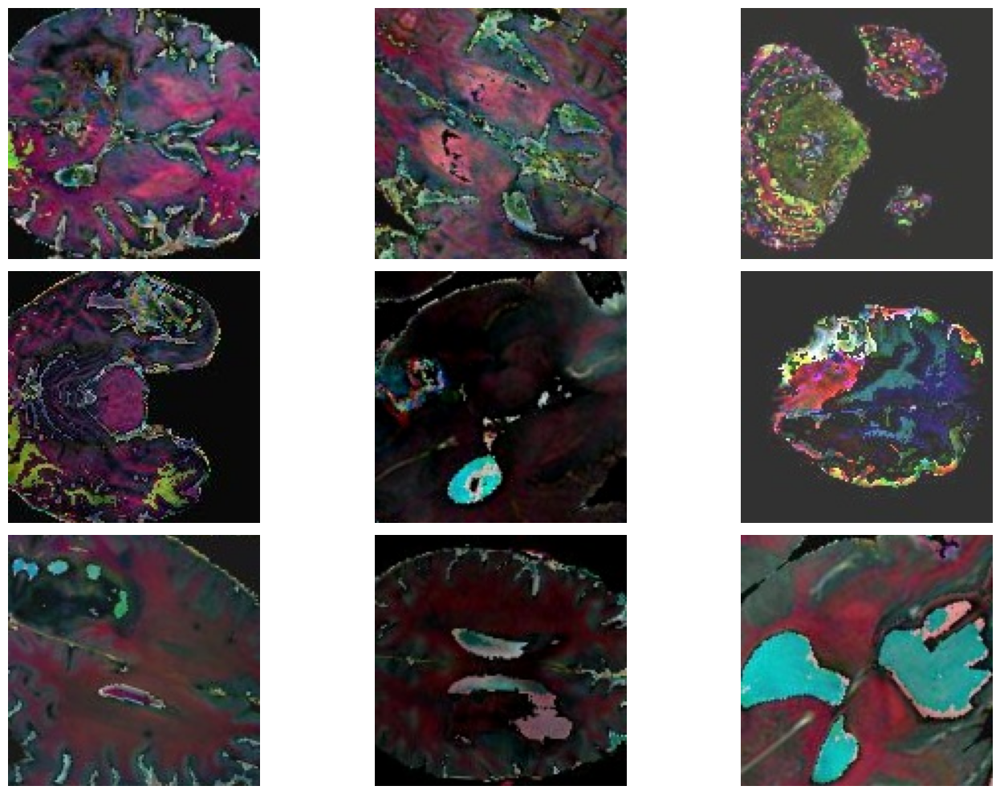

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

path = '/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/'
images_shown = 0

plt.figure(figsize=(15, 10))  # Adjust figure size as needed

for i in os.listdir(path):
    item_path = path + i
    if os.path.isfile(item_path) and item_path.lower().endswith('.jpg'):  # Check if it's an image file
        img = Image.open(item_path)

        plt.subplot(3, 3, images_shown + 1)  # 3 rows, 3 columns of images
        plt.imshow(img)
        plt.axis('off')  # Turn off axis labels

        images_shown += 1
        if images_shown >= 9:
            break

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

# Create Dataframe Image Augmented

In [ ]:
import os
from os import listdir

folder_aug_img = "/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/"

In [ ]:
df_aug = []

In [ ]:
# Calculate xmin,ymin,xmax,ymax

def calculate(filename,x_center,y_center,width,height):
  path_img = f"{folder_aug_img}/{filename}"

  im = Image.open(path_img).convert("RGB")
  img_width, img_height = im.size

  x_center_pixel = x_center * img_width
  y_center_pixel = y_center * img_height
  half_width_pixel = width * img_width / 2
  half_height_pixel = height * img_height / 2

  x_min = int(x_center_pixel - half_width_pixel)
  y_min = int(y_center_pixel - half_height_pixel)
  x_max = int(x_center_pixel + half_width_pixel)
  y_max = int(y_center_pixel + half_height_pixel)

  return x_min,y_min,x_max,y_max

In [ ]:
for labels_file in os.listdir(folder_aug_img):
  if labels_file[-4:] == '.txt':
    file_path = f"{folder_aug_img}/{labels_file}"

    file = open(file_path,"r")
    content = file.readlines()
    filename = labels_file[:-4] + '.jpg'

    for line in content:
      parts = line.strip().split()
      label = int(parts[0])
      x_center = float(parts[1])
      y_center = float(parts[2])
      width = float(parts[3])
      height = float(parts[4])

      x_min,y_min,x_max,y_max = calculate(filename,x_center,y_center,width,height)

      df_aug.append({
        'Filename': filename,
        'Label': int(label),
        'x_Center': x_center,
        'y_Center': y_center,
        'width': width,
        'height': height,
        'x_min': x_min,
        'y_min': y_min,
        'x_max': x_max,
        'y_max': y_max,
        #'path' : f"{folder_train_img}/"
      })

    file.close

In [ ]:
df_aug = pd.DataFrame(df_aug)
df_aug.head()

,Filename,Label,x_Center,y_Center,width,height,x_min,y_min,x_max,y_max
0,volume_358_slice_87_jpg.rf.470407d42ff6a392182...,1,0.506921,0.248812,0.686877,0.497625,20,0,108,63
1,volume_306_slice_63_jpg.rf.43f021980d0527753e1...,0,0.365204,0.799225,0.040247,0.052313,44,98,49,105
2,volume_306_slice_63_jpg.rf.43f021980d0527753e1...,1,0.388904,0.646522,0.247140,0.410032,33,56,65,108
3,volume_57_slice_88_jpg.rf.72f3651c072d34ff4259...,1,0.632812,0.660156,0.421875,0.289062,54,66,108,103
4,volume_132_slice_135_jpg.rf.6f4950c2a05eb0eb12...,1,0.710938,0.316406,0.140625,0.148438,82,31,100,50


In [ ]:
df_aug.shape

(45072, 10)

# Check and Explore Dataset

Check Image before Augmented

In [ ]:
index_img = []
for i in range(len(dataframe_gb)):
  if dataframe_gb['Filename'][i] == 'volume_100_slice_100_jpg.rf.ac33e0ac3a1eebeb5e262e8a6f7de5d9.jpg':
    index_img.append(i)

print(index_img)

[1020]


(139, 132)
1
58.0
9.0
113.0
55.0
volume_100_slice_100_jpg.rf.ac33e0ac3a1eebeb5e262e8a6f7de5d9.jpg
/content/BrainTumorDetectionYolov9/BrainTumorDetectionYolov9/train/images//


/usr/local/lib/python3.10/dist-packages/PIL/ImageDraw.py:296: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.draw.draw_rectangle(xy, ink, 0, width)


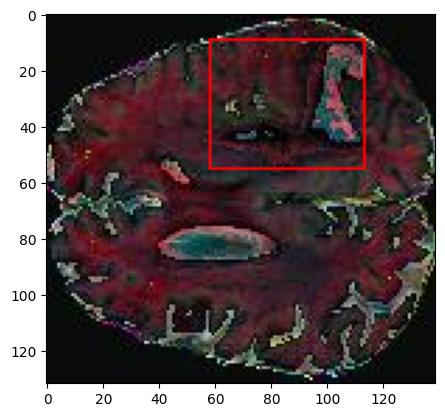

In [ ]:
i=1020
path_img = '/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/images/'
im = Image.open(path_img + dataframe_gb['Filename'][i]).convert('RGB')
print(im.size)
print(dataframe_gb['Label'][i])
print(dataframe_gb['x_min'][i])
print(dataframe_gb['y_min'][i])
print(dataframe_gb['x_max'][i])
print(dataframe_gb['y_max'][i])
print(dataframe_gb['Filename'][i])
print(dataframe_gb['path'][i])

draw = ImageDraw.Draw(im)
boxs = dataframe_gb[['x_min','y_min','x_max','y_max']].iloc[i]
draw.rectangle(boxs,width=1,outline="red") #xmin,ymin,xmax,ymax ,width=>ค.หนากรอบ
plt.imshow(im)

In [ ]:
index_img = []
for i in range(len(dataframe_gb)):
  if dataframe_gb['Filename'][i] == 'volume_100_slice_70_jpg.rf.107f05d1e8d46e2122959586bdabbe9a.jpg':
    index_img.append(i)

print(index_img)

[7152, 7153, 7154]


(139, 132)
0
43.0
0.0
100.0
41.0
volume_100_slice_70_jpg.rf.107f05d1e8d46e2122959586bdabbe9a.jpg
/content/BrainTumorDetectionYolov9/BrainTumorDetectionYolov9/train/images//


/usr/local/lib/python3.10/dist-packages/PIL/ImageDraw.py:296: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.draw.draw_rectangle(xy, ink, 0, width)


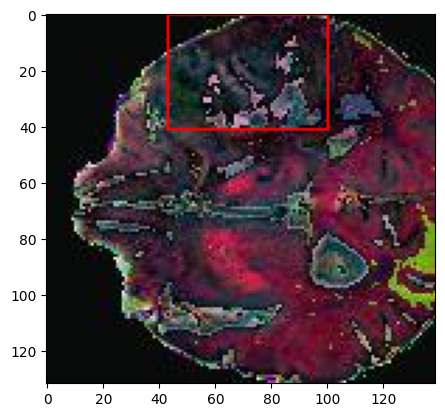

(139, 132)
1
38.0
12.0
121.0
59.0
volume_100_slice_70_jpg.rf.107f05d1e8d46e2122959586bdabbe9a.jpg
/content/BrainTumorDetectionYolov9/BrainTumorDetectionYolov9/train/images//


/usr/local/lib/python3.10/dist-packages/PIL/ImageDraw.py:296: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.draw.draw_rectangle(xy, ink, 0, width)


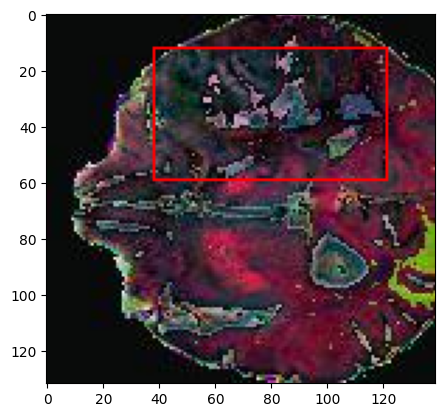

(139, 132)
2
41.0
0.0
102.0
44.0
volume_100_slice_70_jpg.rf.107f05d1e8d46e2122959586bdabbe9a.jpg
/content/BrainTumorDetectionYolov9/BrainTumorDetectionYolov9/train/images//


/usr/local/lib/python3.10/dist-packages/PIL/ImageDraw.py:296: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.draw.draw_rectangle(xy, ink, 0, width)


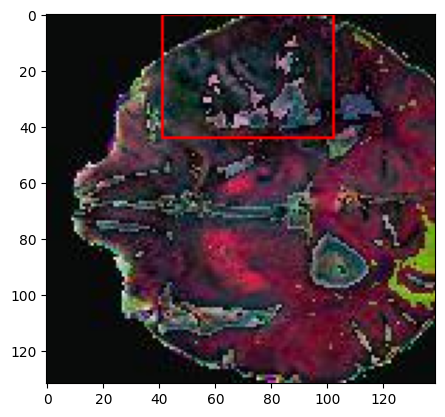

In [ ]:
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

for i in index_img:
  path_img = '/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/images/'
  im = Image.open(path_img + dataframe_gb['Filename'][i]).convert('RGB')
  print(im.size)
  print(dataframe_gb['Label'][i])
  print(dataframe_gb['x_min'][i])
  print(dataframe_gb['y_min'][i])
  print(dataframe_gb['x_max'][i])
  print(dataframe_gb['y_max'][i])
  print(dataframe_gb['Filename'][i])
  print(dataframe_gb['path'][i])
  draw = ImageDraw.Draw(im)
  boxs = dataframe_gb[['x_min','y_min','x_max','y_max']].iloc[i]
  draw.rectangle(boxs,width=1,outline="red")
  plt.imshow(im)
  plt.show() # Added to display each image individually

Check Image Augmented

In [ ]:
for i in range(len(df_aug)):
  if df_aug['Filename'][i] == 'volume_100_slice_100_jpg.rf.ac33e0ac3a1eebeb5e262e8a6f7de5d9_augmented_2.jpg':
    print(i)

43391


(128, 128)
1
20
10
88
50
volume_292_slice_37_jpg.rf.f2c82f5c700c73557264f4b1e0e152c1_augmented_2.jpg


/usr/local/lib/python3.10/dist-packages/PIL/ImageDraw.py:296: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.draw.draw_rectangle(xy, ink, 0, width)


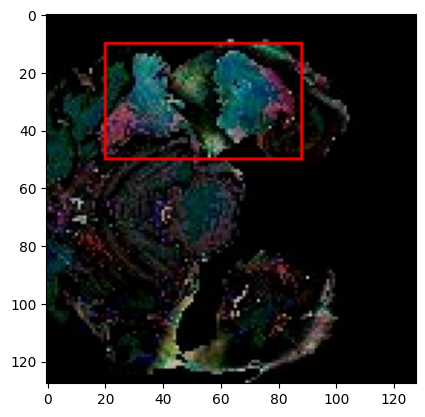

In [ ]:
i=40893
path_img = '/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/'
im = Image.open(path_img + df_aug['Filename'][i]).convert('RGB')
print(im.size)
print(df_aug['Label'][i])
print(df_aug['x_min'][i])
print(df_aug['y_min'][i])
print(df_aug['x_max'][i])
print(df_aug['y_max'][i])
print(df_aug['Filename'][i])

draw = ImageDraw.Draw(im)
boxs = df_aug[['x_min','y_min','x_max','y_max']].iloc[i]
draw.rectangle(boxs,width=1,outline="red") #xmin,ymin,xmax,ymax ,width=>ค.หนากรอบ
plt.imshow(im)

(128, 128)
1
14
76
80
128
volume_192_slice_71_jpg.rf.824739d016b021dd4594e0e7406deb26_augmented_0.jpg


/usr/local/lib/python3.10/dist-packages/PIL/ImageDraw.py:296: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.draw.draw_rectangle(xy, ink, 0, width)


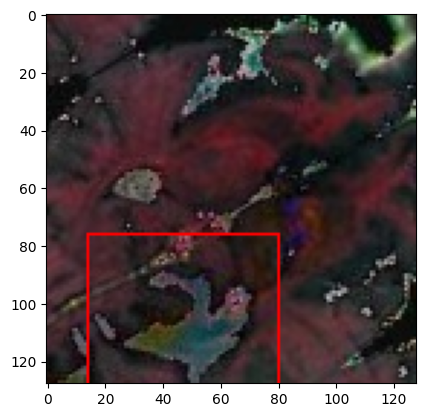

In [ ]:
i=37417
path_img = '/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/'
im = Image.open(path_img + df_aug['Filename'][i]).convert('RGB')
print(im.size)
print(df_aug['Label'][i])
print(df_aug['x_min'][i])
print(df_aug['y_min'][i])
print(df_aug['x_max'][i])
print(df_aug['y_max'][i])
print(df_aug['Filename'][i])

draw = ImageDraw.Draw(im)
boxs = df_aug[['x_min','y_min','x_max','y_max']].iloc[i]
draw.rectangle(boxs,width=1,outline="red") #xmin,ymin,xmax,ymax ,width=>ค.หนากรอบ
plt.imshow(im)

(128, 128)
1
32
78
97
128
volume_156_slice_45_jpg.rf.16b3f7f92afdd61111a64cb484180c50_augmented_2.jpg


/usr/local/lib/python3.10/dist-packages/PIL/ImageDraw.py:296: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.draw.draw_rectangle(xy, ink, 0, width)


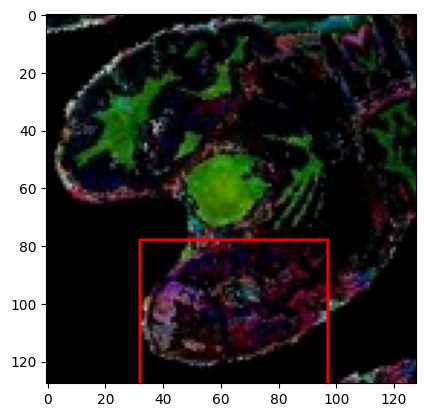

In [ ]:
i=43381
path_img = '/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/'
im = Image.open(path_img + df_aug['Filename'][i]).convert('RGB')
print(im.size)
print(df_aug['Label'][i])
print(df_aug['x_min'][i])
print(df_aug['y_min'][i])
print(df_aug['x_max'][i])
print(df_aug['y_max'][i])
print(df_aug['Filename'][i])

draw = ImageDraw.Draw(im)
boxs = df_aug[['x_min','y_min','x_max','y_max']].iloc[i]
draw.rectangle(boxs,width=1,outline="red") #xmin,ymin,xmax,ymax ,width=>ค.หนากรอบ
plt.imshow(im)

In [ ]:
index_img = []
for i in range(len(df_aug)):
  for j in range(3):
    if df_aug['Filename'][i] == f'volume_100_slice_70_jpg.rf.107f05d1e8d46e2122959586bdabbe9a_augmented_{j}.jpg':
      index_img.append(i)

print(index_img)

[13306, 13307, 13308, 14901, 14902, 14903, 35503, 35504, 35505]


(128, 128)
0
33
0
90
37
volume_100_slice_70_jpg.rf.107f05d1e8d46e2122959586bdabbe9a_augmented_0.jpg


/usr/local/lib/python3.10/dist-packages/PIL/ImageDraw.py:296: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.draw.draw_rectangle(xy, ink, 0, width)


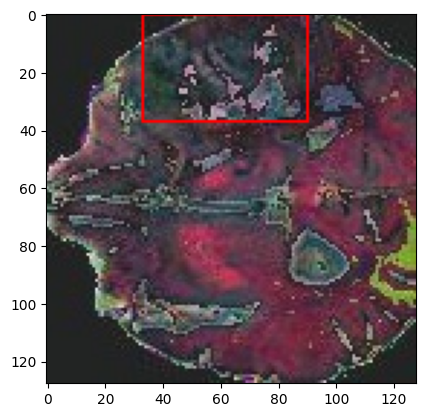

(128, 128)
1
28
8
111
55
volume_100_slice_70_jpg.rf.107f05d1e8d46e2122959586bdabbe9a_augmented_0.jpg


/usr/local/lib/python3.10/dist-packages/PIL/ImageDraw.py:296: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.draw.draw_rectangle(xy, ink, 0, width)


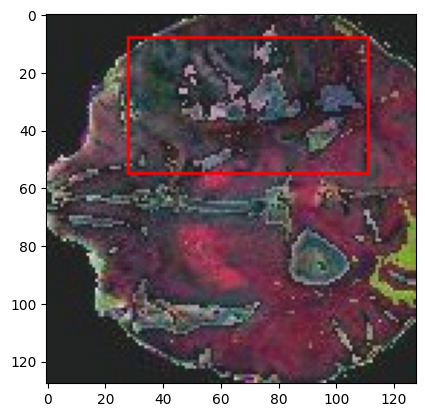

(128, 128)
2
31
0
92
40
volume_100_slice_70_jpg.rf.107f05d1e8d46e2122959586bdabbe9a_augmented_0.jpg


/usr/local/lib/python3.10/dist-packages/PIL/ImageDraw.py:296: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.draw.draw_rectangle(xy, ink, 0, width)


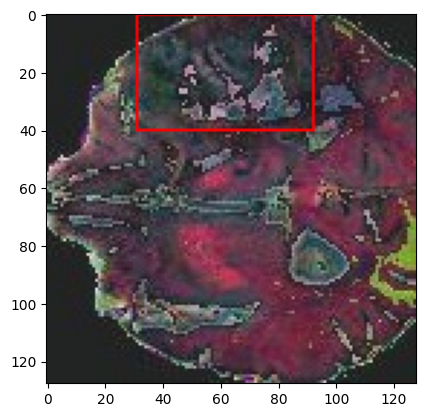

(128, 128)
0
32
0
91
38
volume_100_slice_70_jpg.rf.107f05d1e8d46e2122959586bdabbe9a_augmented_1.jpg


/usr/local/lib/python3.10/dist-packages/PIL/ImageDraw.py:296: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.draw.draw_rectangle(xy, ink, 0, width)


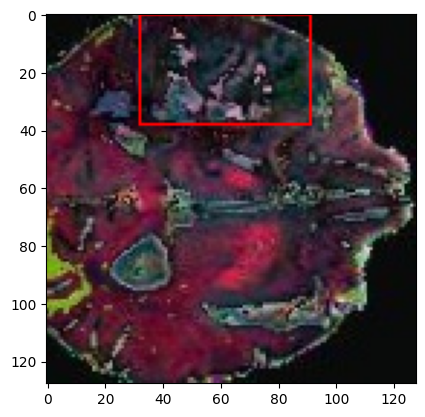

(128, 128)
1
12
6
97
57
volume_100_slice_70_jpg.rf.107f05d1e8d46e2122959586bdabbe9a_augmented_1.jpg


/usr/local/lib/python3.10/dist-packages/PIL/ImageDraw.py:296: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.draw.draw_rectangle(xy, ink, 0, width)


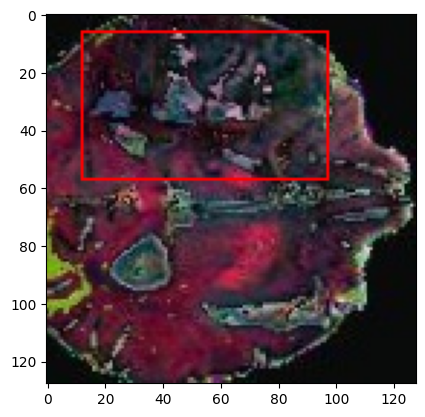

(128, 128)
2
30
0
93
41
volume_100_slice_70_jpg.rf.107f05d1e8d46e2122959586bdabbe9a_augmented_1.jpg


/usr/local/lib/python3.10/dist-packages/PIL/ImageDraw.py:296: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.draw.draw_rectangle(xy, ink, 0, width)


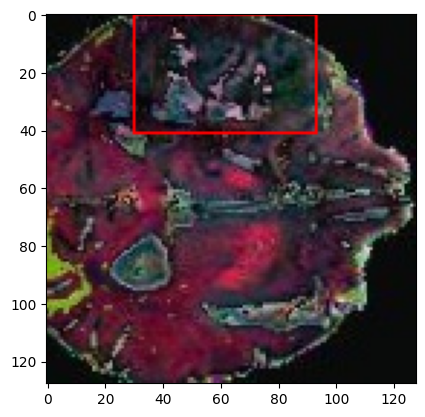

(128, 128)
0
37
0
97
42
volume_100_slice_70_jpg.rf.107f05d1e8d46e2122959586bdabbe9a_augmented_2.jpg


/usr/local/lib/python3.10/dist-packages/PIL/ImageDraw.py:296: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.draw.draw_rectangle(xy, ink, 0, width)


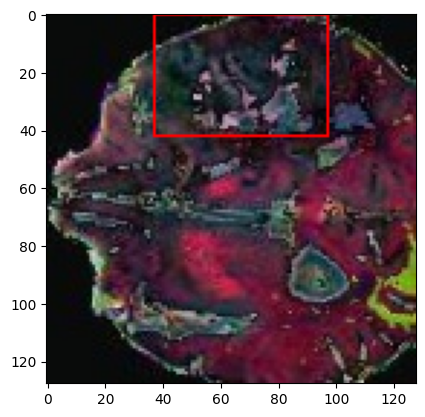

(128, 128)
1
30
8
117
62
volume_100_slice_70_jpg.rf.107f05d1e8d46e2122959586bdabbe9a_augmented_2.jpg


/usr/local/lib/python3.10/dist-packages/PIL/ImageDraw.py:296: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.draw.draw_rectangle(xy, ink, 0, width)


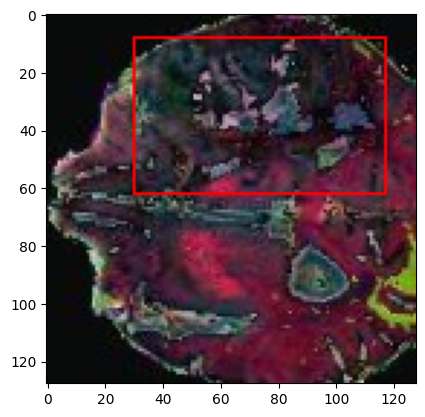

(128, 128)
2
34
0
99
45
volume_100_slice_70_jpg.rf.107f05d1e8d46e2122959586bdabbe9a_augmented_2.jpg


/usr/local/lib/python3.10/dist-packages/PIL/ImageDraw.py:296: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.draw.draw_rectangle(xy, ink, 0, width)


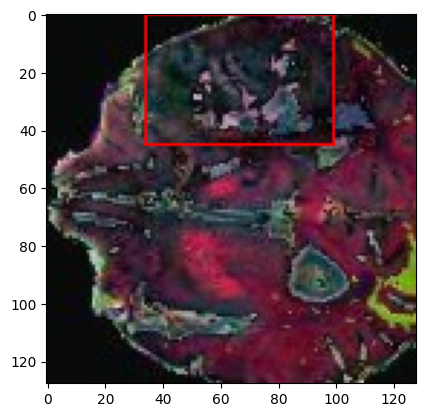

In [ ]:
for i in index_img:
  path_img = '/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image/'
  im = Image.open(path_img + df_aug['Filename'][i]).convert('RGB')
  print(im.size)
  print(df_aug['Label'][i])
  print(df_aug['x_min'][i])
  print(df_aug['y_min'][i])
  print(df_aug['x_max'][i])
  print(df_aug['y_max'][i])
  print(df_aug['Filename'][i])
  draw = ImageDraw.Draw(im)
  boxs = df_aug[['x_min','y_min','x_max','y_max']].iloc[i]
  draw.rectangle(boxs,width=1,outline="red")
  plt.imshow(im)
  plt.show() # Added to display each image individually

In [ ]:
dataframe_gb.shape

(15041, 11)

In [ ]:
dataframe_gb['Label'].value_counts()

,count
Label,
1,6745
0,4238
2,4058


In [ ]:
df_aug.shape

(45072, 10)

In [ ]:
df_aug['Label'].value_counts()

,count
Label,
1,20209
0,12714
2,12149


#Test augmentation base on the label of interest

In [ ]:
label_1_count = 0
for img_name in os.listdir('/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/images/'):
    image_path = f'/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/images/{img_name}'
    save_dir = '/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image1/'

    # Filter the bounding boxes from the dataframe for the current image
    bboxes = []
    class_labels = []

    for _, row in dataframe_gb[dataframe_gb['Filename'] == img_name].iterrows():
        label = row['Label']
        x_min = row['x_min']
        y_min = row['y_min']
        x_max = row['x_max']
        y_max = row['y_max']
        bboxes.append([x_min, y_min, x_max, y_max])
        class_labels.append(label)

    # Apply augmentations and save images and labels
    if 1 in class_labels:
        label_1_count += 1
        if label_1_count % 2 == 0:
            augment_and_save(img_name, image_path, save_dir, bboxes, class_labels, transform, num_augmentations=3)
    else:
        augment_and_save(img_name, image_path, save_dir, bboxes, class_labels, transform, num_augmentations=3)

Streaming output truncated to the last 5000 lines.
Saved: /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image1/volume_230_slice_80_jpg.rf.2638820fc8c5b8e0591b023ad8893618_augmented_1.jpg and /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image1/volume_230_slice_80_jpg.rf.2638820fc8c5b8e0591b023ad8893618_augmented_1.txt
Saved: /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image1/volume_230_slice_80_jpg.rf.2638820fc8c5b8e0591b023ad8893618_augmented_2.jpg and /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image1/volume_230_slice_80_jpg.rf.2638820fc8c5b8e0591b023ad8893618_augmented_2.txt
Saved: /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image1/volume_173_slice_79_jpg.rf.e266300533ce0a23a2601de883d986af_augmented_0.jpg and /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image1/volume_173_slice_79_jpg.rf.e266300533ce0a23a2601de883d986af_au

In [ ]:
num_label1 = (dataframe_gb['Label'] == 1).value_counts()
print(num_label1)

Label
False    8296
True     6745
Name: count, dtype: int64


In [ ]:
(num_label1 // 2).iloc[1] # True

3372

In [ ]:
label_1_count = 0
for img_name in os.listdir('/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/images/'):
    image_path = f'/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/images/{img_name}'
    save_dir = '/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image2/'

    # Filter the bounding boxes from the dataframe for the current image
    bboxes = []
    class_labels = []

    for _, row in dataframe_gb[dataframe_gb['Filename'] == img_name].iterrows():
        label = row['Label']
        x_min = row['x_min']
        y_min = row['y_min']
        x_max = row['x_max']
        y_max = row['y_max']
        bboxes.append([x_min, y_min, x_max, y_max])
        class_labels.append(label)

    # Apply augmentations and save images and labels
    for i in range(len(class_labels)):
      if class_labels[i]==1:
          label_1_count += 1
          if label_1_count == (num_label1 // 2).iloc[1]:
              augment_and_save(img_name, image_path, save_dir, bboxes, class_labels, transform, num_augmentations=3)
      else:
          augment_and_save(img_name, image_path, save_dir, bboxes, class_labels, transform, num_augmentations=3)

Streaming output truncated to the last 5000 lines.
Saved: /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image2/volume_318_slice_92_jpg.rf.14e1d80d72cf9a372e13903b81b7ee27_augmented_1.jpg and /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image2/volume_318_slice_92_jpg.rf.14e1d80d72cf9a372e13903b81b7ee27_augmented_1.txt
Saved: /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image2/volume_318_slice_92_jpg.rf.14e1d80d72cf9a372e13903b81b7ee27_augmented_2.jpg and /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image2/volume_318_slice_92_jpg.rf.14e1d80d72cf9a372e13903b81b7ee27_augmented_2.txt
Saved: /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image2/volume_318_slice_92_jpg.rf.14e1d80d72cf9a372e13903b81b7ee27_augmented_0.jpg and /content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image2/volume_318_slice_92_jpg.rf.14e1d80d72cf9a372e13903b81b7ee27_au

In [ ]:
import os
from os import listdir

folder_aug_img1 = "/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image1/"
folder_aug_img2 = "/content/TumorDetectionYolov8/OD8/Brain Tumor Detection/train/augmented_image2/"

In [ ]:
df_aug1 = []
df_aug2 = []

In [ ]:
# Calculate xmin,ymin,xmax,ymax

def calculate(filename,x_center,y_center,width,height):
  path_img = f"{folder_aug_img1}/{filename}"

  im = Image.open(path_img).convert("RGB")
  img_width, img_height = im.size

  x_center_pixel = x_center * img_width
  y_center_pixel = y_center * img_height
  half_width_pixel = width * img_width / 2
  half_height_pixel = height * img_height / 2

  x_min = int(x_center_pixel - half_width_pixel)
  y_min = int(y_center_pixel - half_height_pixel)
  x_max = int(x_center_pixel + half_width_pixel)
  y_max = int(y_center_pixel + half_height_pixel)

  return x_min,y_min,x_max,y_max

In [ ]:
for labels_file in os.listdir(folder_aug_img1):
  if labels_file[-4:] == '.txt':
    file_path = f"{folder_aug_img1}/{labels_file}"

    file = open(file_path,"r")
    content = file.readlines()
    filename = labels_file[:-4] + '.jpg'

    for line in content:
      parts = line.strip().split()
      label = int(parts[0])
      x_center = float(parts[1])
      y_center = float(parts[2])
      width = float(parts[3])
      height = float(parts[4])

      x_min,y_min,x_max,y_max = calculate(filename,x_center,y_center,width,height)

      df_aug1.append({
        'Filename': filename,
        'Label': int(label),
        'x_Center': x_center,
        'y_Center': y_center,
        'width': width,
        'height': height,
        'x_min': x_min,
        'y_min': y_min,
        'x_max': x_max,
        'y_max': y_max,
        #'path' : f"{folder_train_img}/"
      })

    file.close

In [ ]:
df_aug1 = pd.DataFrame(df_aug1)
df_aug1.head()

,Filename,Label,x_Center,y_Center,width,height,x_min,y_min,x_max,y_max
0,volume_358_slice_87_jpg.rf.470407d42ff6a392182...,1,0.355469,0.214844,0.570312,0.382812,9,3,81,52
1,volume_306_slice_63_jpg.rf.43f021980d0527753e1...,0,0.625946,0.772250,0.034900,0.049225,77,95,82,101
2,volume_306_slice_63_jpg.rf.43f021980d0527753e1...,1,0.582998,0.623807,0.201953,0.395337,61,54,87,105
3,volume_57_slice_88_jpg.rf.72f3651c072d34ff4259...,1,0.409830,0.688985,0.460577,0.349268,22,65,81,110
4,volume_57_slice_94_jpg.rf.afce23af0f7fd497e8c6...,1,0.363281,0.699219,0.507812,0.320312,14,69,79,110


In [ ]:
df_aug1.shape

(22908, 10)

-------------------------------------

In [ ]:
# Calculate xmin,ymin,xmax,ymax

def calculate(filename,x_center,y_center,width,height):
  path_img = f"{folder_aug_img2}/{filename}"

  im = Image.open(path_img).convert("RGB")
  img_width, img_height = im.size

  x_center_pixel = x_center * img_width
  y_center_pixel = y_center * img_height
  half_width_pixel = width * img_width / 2
  half_height_pixel = height * img_height / 2

  x_min = int(x_center_pixel - half_width_pixel)
  y_min = int(y_center_pixel - half_height_pixel)
  x_max = int(x_center_pixel + half_width_pixel)
  y_max = int(y_center_pixel + half_height_pixel)

  return x_min,y_min,x_max,y_max

In [ ]:
for labels_file in os.listdir(folder_aug_img2):
  if labels_file[-4:] == '.txt':
    file_path = f"{folder_aug_img2}/{labels_file}"

    file = open(file_path,"r")
    content = file.readlines()
    filename = labels_file[:-4] + '.jpg'

    for line in content:
      parts = line.strip().split()
      label = int(parts[0])
      x_center = float(parts[1])
      y_center = float(parts[2])
      width = float(parts[3])
      height = float(parts[4])

      x_min,y_min,x_max,y_max = calculate(filename,x_center,y_center,width,height)

      df_aug2.append({
        'Filename': filename,
        'Label': int(label),
        'x_Center': x_center,
        'y_Center': y_center,
        'width': width,
        'height': height,
        'x_min': x_min,
        'y_min': y_min,
        'x_max': x_max,
        'y_max': y_max,
        #'path' : f"{folder_train_img}/"
      })

    file.close

In [ ]:
df_aug2 = pd.DataFrame(df_aug2)
df_aug2.head()

,Filename,Label,x_Center,y_Center,width,height,x_min,y_min,x_max,y_max
0,volume_306_slice_63_jpg.rf.43f021980d0527753e1...,0,0.679688,0.773438,0.031250,0.046875,85,96,89,102
1,volume_306_slice_63_jpg.rf.43f021980d0527753e1...,1,0.625000,0.628906,0.171875,0.382812,69,56,91,105
2,volume_57_slice_94_jpg.rf.afce23af0f7fd497e8c6...,1,0.306870,0.682843,0.524118,0.346847,5,65,72,109
3,volume_57_slice_94_jpg.rf.afce23af0f7fd497e8c6...,2,0.298489,0.619809,0.128560,0.076856,29,74,46,84
4,volume_364_slice_70_jpg.rf.461aae7d39a897d558b...,0,0.687500,0.089844,0.125000,0.085938,80,6,96,17


-----------------------------------------

In [ ]:
dataframe_gb['Label'].value_counts()

,count
Label,
1,6745
0,4238
2,4058


In [ ]:
df_aug['Label'].value_counts()

,count
Label,
1,20209
0,12714
2,12149


In [ ]:
df_aug1['Label'].value_counts()

,count
Label,
1,10110
0,6569
2,6229


In [ ]:
df_aug2['Label'].value_counts()

,count
Label,
1,13845
0,12717
2,12139


In [ ]:
print(6745+13845)
print(4238+12717)
print(4058+12139)

20590
16955
16197
